# **Race and Green Space Data Exploration**
###### *Estefany Garcia*
#### In this notebook, I will be exploring racial demographics within the city of Los Angeles through census tract information while also exploring access to green space provided by the Los Angeles Department of Recreation and Parks. 

# 1. First we import libraries 


In [2]:

### for spatial data
import geopandas as gpd

### for plotting
import matplotlib.pyplot as plt

### for network analysis
import networkx as nx

### for street network analysis
import osmnx as ox

### for basemaps
import contextily as ctx


/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


# 2. Then we  import our dataset, starting off with racial demographics. For this notebook I will call the racial demographic data "race"

In [4]:
race=gpd.read_file('larace.geojson')

# 3. To get a better understanding of the data, we use .shape to see how many values we are going to be working with. 

In [5]:
race.shape

(1005, 45)

# 4. I now want to see the data in a simple plot

<AxesSubplot:>

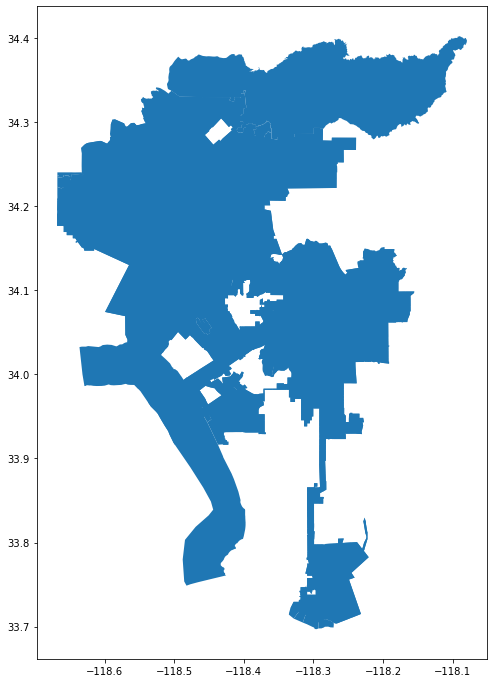

In [6]:
race.plot(figsize=(12,12))

# 5. I will now proceed to clean up our census data. I will start off by viewing the data and removing the first column. 

In [7]:
race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1005 entries, 0 to 1004
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             1005 non-null   object  
 1   name              1005 non-null   object  
 2   B03002001         1005 non-null   float64 
 3   B03002001, Error  1005 non-null   float64 
 4   B03002002         1005 non-null   float64 
 5   B03002002, Error  1005 non-null   float64 
 6   B03002003         1005 non-null   float64 
 7   B03002003, Error  1005 non-null   float64 
 8   B03002004         1005 non-null   float64 
 9   B03002004, Error  1005 non-null   float64 
 10  B03002005         1005 non-null   float64 
 11  B03002005, Error  1005 non-null   float64 
 12  B03002006         1005 non-null   float64 
 13  B03002006, Error  1005 non-null   float64 
 14  B03002007         1005 non-null   float64 
 15  B03002007, Error  1005 non-null   float64 
 16  B03002008       

In [8]:
race.geoid.head()

0    14000US06037101110
1    14000US06037101122
2    14000US06037101210
3    14000US06037101220
4    14000US06037101300
Name: geoid, dtype: object

In [9]:
race.head()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,3095.0,354.0,2616.0,306.0,19.0,15.0,...,12.0,383.0,311.0,74.0,52.0,34.0,28.0,40.0,46.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,3258.0,344.0,2882.0,358.0,74.0,102.0,...,12.0,48.0,55.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,3731.0,465.0,2986.0,435.0,198.0,165.0,...,17.0,874.0,477.0,81.0,80.0,48.0,62.0,33.0,51.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,2338.0,236.0,1812.0,271.0,87.0,107.0,...,12.0,497.0,231.0,45.0,42.0,11.0,18.0,34.0,39.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,394.0,3587.0,363.0,3126.0,359.0,205.0,232.0,...,12.0,45.0,38.0,28.0,32.0,28.0,32.0,0.0,12.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


In [10]:
race = race.drop([0])

In [11]:
race.head()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,3258.0,344.0,2882.0,358.0,74.0,102.0,...,12.0,48.0,55.0,0.0,12.0,0.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,3731.0,465.0,2986.0,435.0,198.0,165.0,...,17.0,874.0,477.0,81.0,80.0,48.0,62.0,33.0,51.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,2338.0,236.0,1812.0,271.0,87.0,107.0,...,12.0,497.0,231.0,45.0,42.0,11.0,18.0,34.0,39.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,394.0,3587.0,363.0,3126.0,359.0,205.0,232.0,...,12.0,45.0,38.0,28.0,32.0,28.0,32.0,0.0,12.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
5,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,377.0,2867.0,393.0,2271.0,355.0,9.0,15.0,...,12.0,104.0,68.0,7.0,12.0,7.0,12.0,0.0,12.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221..."


# 6. We have successfully removed the first column in the census dataset. We will now rename our variables and only keep relevant information. 

In [12]:
list(race)

['geoid',
 'name',
 'B03002001',
 'B03002001, Error',
 'B03002002',
 'B03002002, Error',
 'B03002003',
 'B03002003, Error',
 'B03002004',
 'B03002004, Error',
 'B03002005',
 'B03002005, Error',
 'B03002006',
 'B03002006, Error',
 'B03002007',
 'B03002007, Error',
 'B03002008',
 'B03002008, Error',
 'B03002009',
 'B03002009, Error',
 'B03002010',
 'B03002010, Error',
 'B03002011',
 'B03002011, Error',
 'B03002012',
 'B03002012, Error',
 'B03002013',
 'B03002013, Error',
 'B03002014',
 'B03002014, Error',
 'B03002015',
 'B03002015, Error',
 'B03002016',
 'B03002016, Error',
 'B03002017',
 'B03002017, Error',
 'B03002018',
 'B03002018, Error',
 'B03002019',
 'B03002019, Error',
 'B03002020',
 'B03002020, Error',
 'B03002021',
 'B03002021, Error',
 'geometry']

In [13]:
# columns to keep
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002012',
 'geometry']

In [14]:
race = race[columns_to_keep]

In [15]:
race.head()

,geoid,name,B03002001,B03002002,B03002003,B03002004,B03002005,B03002006,B03002007,B03002008,B03002009,B03002012,geometry
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,67.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,14.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,98.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,62.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
5,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,2867.0,2271.0,9.0,13.0,409.0,0.0,28.0,137.0,591.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221..."


In [16]:
list(race)

['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002012',
 'geometry']

In [17]:
race.columns = ['geoid',
 'name',
 'total',
 'non hispanic',
 'white',
 'black',
 'native',
 'asian',
 'pacific islander',
 'non hispanic some other race',
 'non hispanic two or more races',
 'hispanic',
 'geometry']

In [18]:
race.head()

,geoid,name,total,non hispanic,white,black,native,asian,pacific islander,non hispanic some other race,non hispanic two or more races,hispanic,geometry
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,67.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,14.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,98.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,62.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
5,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,2867.0,2271.0,9.0,13.0,409.0,0.0,28.0,137.0,591.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221..."


# 7. After having cleaned our data, I will now make the data into percentages to be able to compare then to eachother. 

In [19]:
race['percent non hispanic'] = race['non hispanic']/race['total']*100
race['percent hispanic'] = race['hispanic']/race['total']*100

In [20]:
race.sample(5)

,geoid,name,total,non hispanic,white,black,native,asian,pacific islander,non hispanic some other race,non hispanic two or more races,hispanic,geometry,percent non hispanic,percent hispanic
736,14000US06037231900,"Census Tract 2319, Los Angeles, CA",6162.0,854.0,24.0,645.0,31.0,16.0,0.0,0.0,138.0,5308.0,"MULTIPOLYGON (((-118.28098 34.00377, -118.2805...",13.859137,86.140863
829,14000US06037262301,"Census Tract 2623.01, Los Angeles, CA",2748.0,2455.0,1980.0,68.0,0.0,362.0,0.0,0.0,45.0,293.0,"MULTIPOLYGON (((-118.51348 34.12904, -118.5133...",89.337700,10.662300
92,14000US06037113233,"Census Tract 1132.33, Los Angeles, CA",7345.0,3046.0,1405.0,482.0,0.0,1055.0,0.0,22.0,82.0,4299.0,"MULTIPOLYGON (((-118.60591 34.22582, -118.6058...",41.470388,58.529612
357,14000US06037181600,"Census Tract 1816, Los Angeles, CA",4631.0,3107.0,1499.0,130.0,0.0,1079.0,58.0,19.0,322.0,1524.0,"MULTIPOLYGON (((-118.21828 34.13188, -118.2181...",67.091341,32.908659
201,14000US06037124600,"Census Tract 1246, Los Angeles, CA",2691.0,2351.0,1825.0,138.0,12.0,91.0,0.0,0.0,285.0,340.0,"MULTIPOLYGON (((-118.43124 34.16834, -118.4301...",87.365292,12.634708


In [21]:
race['percent white'] = race['white']/race['total']*100
race['percent black'] = race['black']/race['total']*100
race['percent native'] = race['native']/race['total']*100
race['percent asian'] = race['asian']/race['total']*100
race['percent pacific islander'] = race['pacific islander']/race['total']*100
race['percent non hispanic some other race'] = race['non hispanic some other race']/race['total']*100
race['percent non hispanic two or more races'] = race['non hispanic two or more races']/race['total']*100

In [22]:
race.head()

,geoid,name,total,non hispanic,white,black,native,asian,pacific islander,non hispanic some other race,...,geometry,percent non hispanic,percent hispanic,percent white,percent black,percent native,percent asian,percent pacific islander,percent non hispanic some other race,percent non hispanic two or more races
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,3258.0,2882.0,74.0,15.0,220.0,0.0,0.0,...,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",95.682819,4.317181,84.640235,2.173275,0.440529,6.461087,0.0,0.000000,1.967695
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,3731.0,2986.0,198.0,0.0,486.0,0.0,47.0,...,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",58.783677,41.216323,47.045848,3.119584,0.000000,7.657161,0.0,0.740507,0.220577
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,2338.0,1812.0,87.0,0.0,341.0,0.0,0.0,...,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",63.155051,36.844949,48.946515,2.350081,0.000000,9.211237,0.0,0.000000,2.647218
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,3587.0,3126.0,205.0,0.0,194.0,0.0,0.0,...,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",92.353244,7.646756,80.484037,5.278064,0.000000,4.994851,0.0,0.000000,1.596292
5,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,2867.0,2271.0,9.0,13.0,409.0,0.0,28.0,...,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221...",82.909196,17.090804,65.673800,0.260266,0.375940,11.827646,0.0,0.809717,3.961828


<AxesSubplot:>

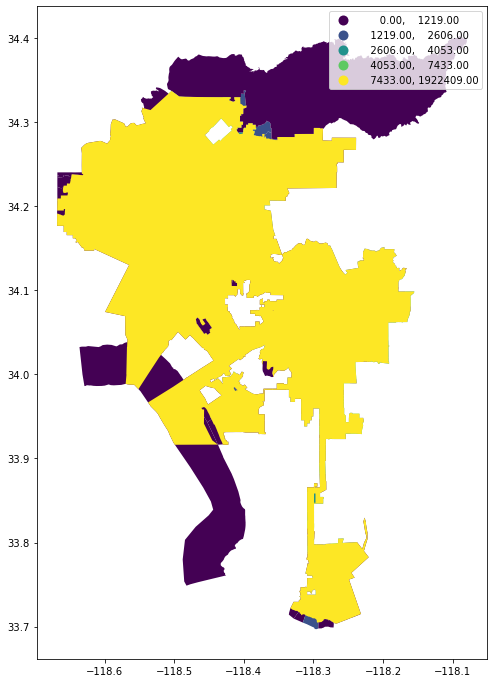

In [23]:

race.plot(figsize=(12,12),
                 column='hispanic',
                 legend=True, 
                 scheme='Natural_breaks')

#### Here is one with white population.

<AxesSubplot:>

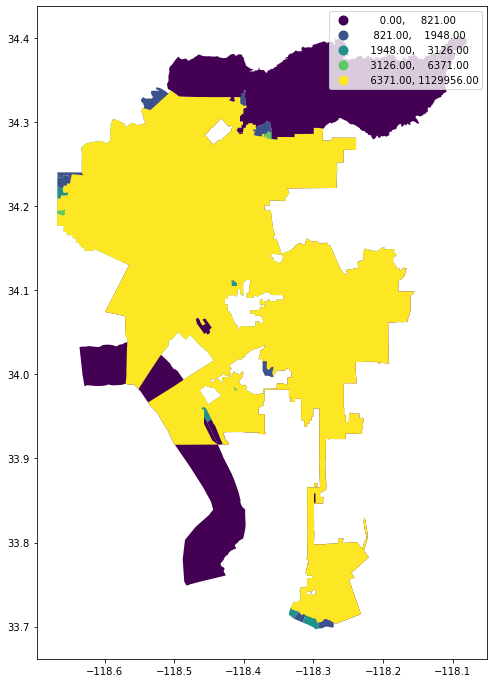

In [24]:
race.plot(figsize=(12,12),
                 column='white',
                 legend=True, 
                 scheme='NaturalBreaks')

# 8. I now want to attempt to have 2 maps side by side.

Text(0.5, 1.0, 'Percent Non Hispanic')

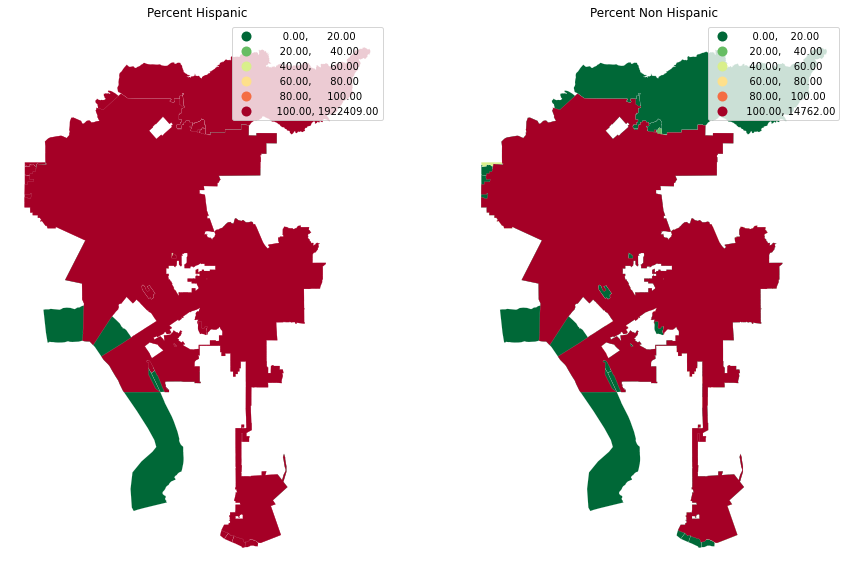

In [25]:
# create the 1x2 subplots
# set sharex and sharey to true to scale each map equally
fig, axs = plt.subplots(1, 2, figsize=(15, 12), sharex=True, sharey=True)

# name each subplot
ax1, ax2 = axs

# percent hispanic map on the left
race.plot(column='hispanic', 
            cmap='RdYlGn_r', 
            scheme='user_defined',
            classification_kwds={'bins':[20,40,60,80,100]},
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Percent Hispanic")

# percent black map on the right
race.plot(column='non hispanic some other race', 
            cmap='RdYlGn_r', 
            scheme='user_defined',
            classification_kwds={'bins':[20,40,60,80,100]},
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Percent Non Hispanic")

# 9. I will now add a base map

In [26]:

race_web_mercator = race.to_crs(epsg=3857)

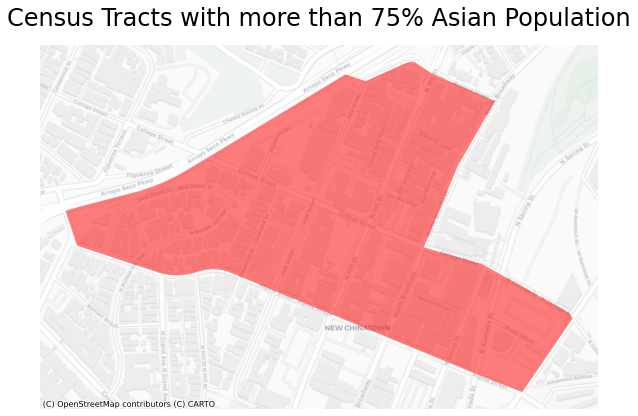

In [27]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

# add the layer with ax=ax in the argument 
race_web_mercator[race_web_mercator['percent asian'] > 75].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Census Tracts with more than 75% Asian Population',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

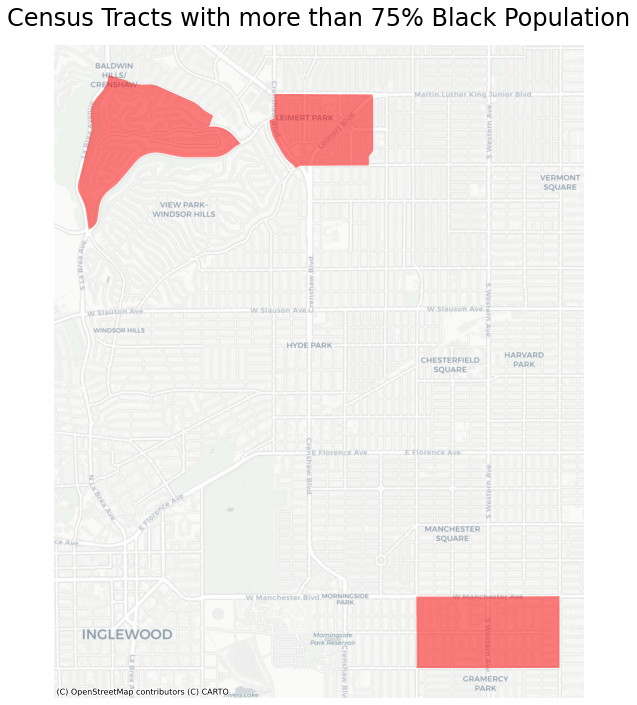

In [28]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(12, 12))

# add the layer with ax=ax in the argument 
race_web_mercator[race_web_mercator['percent black'] > 75].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Census Tracts with more than 75% Black Population',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

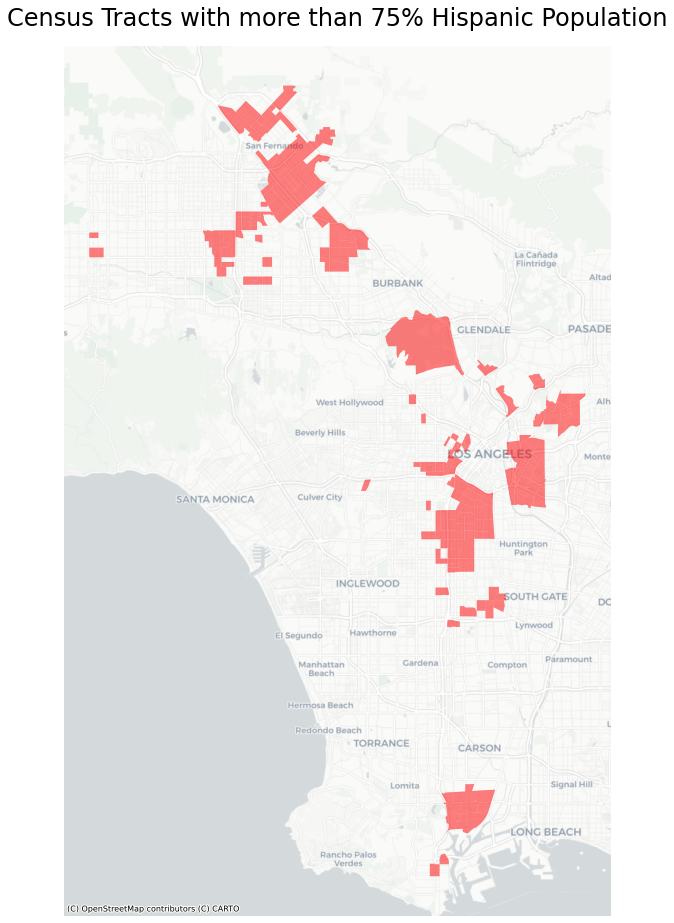

In [29]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(16, 16))

# add the layer with ax=ax in the argument 
race_web_mercator[race_web_mercator['percent hispanic'] > 75].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Census Tracts with more than 75% Hispanic Population',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

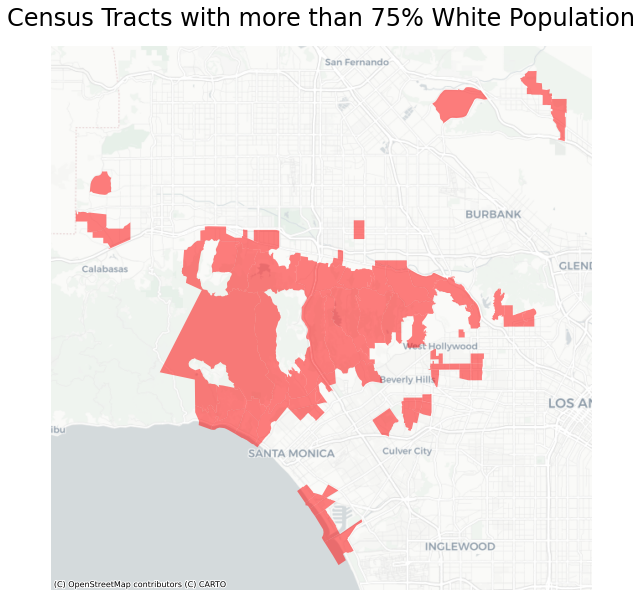

In [30]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

# add the layer with ax=ax in the argument 
race_web_mercator[race_web_mercator['percent white'] > 75].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Census Tracts with more than 75% White Population',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

#### It was exciting to see the racial demographic between white and hispanic community members. I was having a hard time getting the maps to work, but it was until I made the data into perctages, was the data able to best refelct the communities. 

# 10. The maps above repsenent communities that have 75% of its residents either being White or Hispanic. The 2 maps will be my base maps and will proceed to overlaping parks boundaries to the maps above. 

# 11. To start, I will upload the park data set. I will be calling this data set "parks."

In [31]:
parks=gpd.read_file('Department of Recreation and Parks GIS Map of Park Boundaries.geojson')

#### Let's see how the park boundaries look by plotting it. 

<AxesSubplot:>

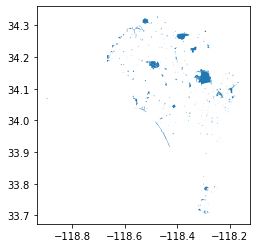

In [32]:
parks.plot()

In [33]:
parks.info

<bound method DataFrame.info of                                address                               name  \
0                   3400 Wilshire blvd  Robert F Kennedy Inspiration Park   
1                  4702 N. Figueroa St                SYCAMORE GROVE PARK   
2                    351 N. Gaffey St.             San Pedro Welcome Park   
3                     1015 S.Wilton PL                  WILTON PLACE PARK   
4                1780 E.Santa Ana Blvd            WATTS CULTURAL CRESCENT   
..                                 ...                                ...   
505  4501 S. CENTRAL AVE, LA, CA 90011  VERNON BRANCH LIBRARY POCKET PARK   
506    4948-4956 YORK BLVD,LA,CA 90042              YORK BLVD POCKET PARK   
507                    1010 W. 25th St           HOOVER RECREATION CENTER   
508                 5340 Canoga Avenue    OLD FIRE STATION 84 POCKET PARK   
509               14353 W. Fox Streeet         FOX AND LAUREL CANYON PARK   

    objectid                               

# 12. I now want to add a subplot to the census information with park information. 

In [34]:
import folium

In [35]:
m = folium.Map(location=[34.0536909,-118.242766], zoom_start=10, tiles='CartoDB positron')

In [36]:
m

In [37]:
race = race.to_crs(4326)

In [38]:
parks = parks.to_crs(4326)

In [39]:
folium.GeoJson(race, name="geojson").add_to(m)

In [40]:
m

In [42]:
for _, r in parks.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'red'})
    geo_j.add_to(m)
m

#### I was able to successfully sublot the census tracet information with the park boundaries. Moving forward I want to explore how to be able to disaggregate the data by racial subgroups. 